In [2]:
using Arpack
using LinearAlgebra
using CairoMakie
using LaTeXStrings
using Revise
using Interpolations
using Roots
using ColorSchemes
using Colors
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Spinors/rmg_K.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Lattice_setup/lattice_BZ.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/patch_methods.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/rmg_3pV.jl")

bc_sign_alpha_delta (generic function with 1 method)

In [3]:
function find_intersections(x1, y1, x2, y2)
    # Create interpolants (use linear or cubic splines)
    itp1 = LinearInterpolation(x1, y1)
    itp2 = LinearInterpolation(x2, y2)

    # Define the function whose roots we seek: f(x) = y1(x) - y2(x)
    function diff(x)
        return itp1(x) - itp2(x)
    end

    # Find the common x-range
    x_min = max(minimum(x1), minimum(x2))
    x_max = min(maximum(x1), maximum(x2))

    # Find roots in the common range
    intersections = find_zeros(diff, x_min, x_max)

    # Get corresponding y values
    intersection_points = Array{Float64}(undef, length(intersections), 2)
    for j in 1:length(intersections)
        x = intersections[j]
        intersection_points[j, 1] = x
        intersection_points[j, 2] = itp1(x)
    end

    return intersection_points
end

find_intersections (generic function with 1 method)

In [4]:
# general parameters
pd = 50
mbz_kappa = 1
w = 10^(-1) * mbz_kappa
omega = exp(im * 2 * pi / 3)

-0.4999999999999998 + 0.8660254037844387im

<font size="12">RMG origin study</font>

There are several plots that need to be made (all of these for several $N_L$)
1. 3-Patch BC at origin vs $\nu$ and compare against parent Berry curvature ($0 < \nu < 1$). Try detecting regions of sign flip. With $v_F = 0$. ${\color{red} \text{DONE}}$
2. Plot Berry curvature distributions when $\Omega_{\text{3P}}(0,0) = 0$. ${\color{red} \text{DONE}}$
3. Plot Berry curvature distributions when $\Omega_{\text{3P}}(0,0) = \Omega_{\text{RMG}}(0,0)$. ${\color{red} \text{DONE}}$
4. Plot $\Omega_{\text{3P}} (\textbf{k})$ in flipped region over whole patch (maybe 1-3 representative $\nu$ values).  ${\color{red} \text{DONE}}$
5. Plot the number of $\nu$ when $\Omega_{\text{3P}}(0,0) = 0$ as a function of $v_F$.  ${\color{red} \text{DONE}}$
6. Plot the number of $\nu$ when $\Omega_{\text{3P}}(0,0) = \Omega_{\text{RMG}}(0,0)$ as a function of $v_F$.  ${\color{red} \text{DONE}}$
7. Plot $\nu$ when $\Omega_{\text{3P}}(0,0) = 0$ as a function of $v_F$ (for maybe first $n$ such critical $\nu$). ${\color{red} \text{DONE}}$
8. Plot $\nu$ when $\Omega_{\text{3P}}(0,0) = \Omega_{\text{RMG}}(0,0)$ as a function of $v_F$ (for maybe first $n$ such critical $\nu$). ${\color{red} \text{DONE}}$
9. Repeat the above for both potentials. ${\color{red} \text{DONE}}$

<font size="12">$$N_L \text{-layer potential}$$</font>

<font size="12">$$\Omega(0, 0) \ | \  v_F = 0$$</font>

In [5]:
function rmg_origin_flips(Nl_list, m_kappa, vF, w, pd, nu_llm, nu_ulm)
    nu_pts = 10^2
    nu_list = range(nu_llm, nu_ulm, nu_pts)
    curvature_1 = Array{Float64}(undef, nu_pts)
    curvature_2 = Array{Float64}(undef, nu_pts)
    curvature_3 = Array{Float64}(undef, nu_pts)
    curvature_4 = Array{Float64}(undef, nu_pts)
    spacing = 10^(-2) * (w / 2 / pd)

    P = Figure(size=(1800, 2000), fontsize=30)

    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        for i in 1:nu_pts
            nu = nu_list[i]
            delta = rmg_delta_all(m_kappa, nu, Nl)
            alpha = rmg_alpha_all(m_kappa, nu, Nl)
            grid = reshape([10^(-16), 10^(-16)], (1, 2))
            curvature_1[i] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
            curvature_2[i] = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)[1]
            curvature_3[i] = bc_no_spinors(grid, spacing, vF, delta, alpha)[1]
            # curvature_4[i] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, 0, 0)[1]
        end
        ints = find_intersections(nu_list, curvature_1, nu_list, zeros(nu_pts))
        for i in 1:size(ints, 1)
            t_alpha = rmg_alpha_all(m_kappa, ints[i, 1], Nl)
            t_delta = rmg_delta_all(m_kappa, ints[i, 1], Nl)
            # println("angle: " * string(angle(t_alpha)))
            # println("abs: " * string(abs(t_alpha)))
        end
        ax1 = Axis(P[j, 1], title = "N_L = "*string(Nl), xlabel = L"\nu", ylabel = L"\Omega")
        lines!(ax1, nu_list, curvature_1, label = "3-Patch")
        lines!(ax1, nu_list, curvature_2, label = "Parent")
        lines!(ax1, nu_list, curvature_3, label = "Pure 3p")
        # lines!(ax1, nu_list, curvature_4, label = "Pure vF")
        P[j, 2] = Legend(P, ax1, framevisible = true)
    end
    axs1 = Axis(P[:, 1], title = L"\text{RMG } \Omega (0, 0)", titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    P
end

rmg_origin_flips (generic function with 1 method)

In [6]:
NL_list = [3, 4, 5]
vF = 0

0

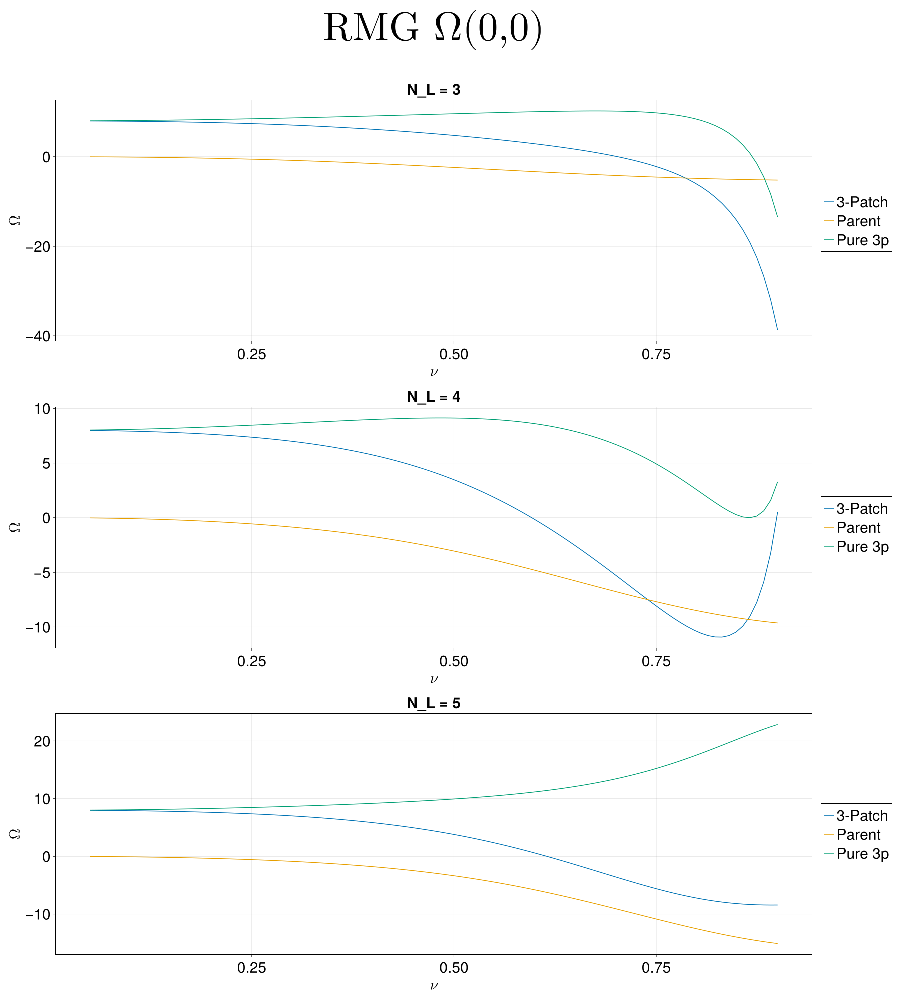

In [7]:
rmg_origin_flips(NL_list, mbz_kappa, vF, w, pd, 0.05, 0.9)

<font size="12">$$\Omega(0, 0) \ | \nu \text{ fixed}$$</font>

In [41]:
function rmg_origin_flips_vF(Nl_list, m_kappa, w, pd)
    vF_pts = 10^2
    vF_list = range(0, 100, vF_pts)
    curvature_1 = Array{Float64}(undef, vF_pts)
    curvature_2 = Array{Float64}(undef, vF_pts)
    curvature_3 = Array{Float64}(undef, vF_pts)
    curvature_4 = Array{Float64}(undef, vF_pts)
    spacing = 10^(-2) * (w / 2 / pd)

    P = Figure(size=(2600, 2000), fontsize=30)

    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        nu1 = 0.1
        # d1 = rmg_delta_all(m_kappa, nu1, Nl)
        d1 = exp(im * 9*pi/5)
        # a1 = rmg_alpha_all(m_kappa, nu1, Nl)
        a1 = exp(im * 8 * pi/5)

        nu2 = 0.4
        # d2 = rmg_delta_all(m_kappa, nu2, Nl)
        d2 = exp(im * 9*pi/5)
        a2 = rmg_alpha_all(m_kappa, nu2, Nl)
        # a2 = exp(im * 8 * pi/5)

        nu3 = 0.7
        d3 = rmg_delta_all(m_kappa, nu3, Nl)
        # d3 = exp(im * pi/5)
        a3 = rmg_alpha_all(m_kappa, nu3, Nl)
        # a3 = exp(im * pi/5)

        nu4 = 0.9
        d4 = rmg_delta_all(m_kappa, nu4, Nl)
        # d4 = exp(im * pi/5)
        a4 = rmg_alpha_all(m_kappa, nu4, Nl)
        # a4 = exp(im * pi/5)

        for i in 1:vF_pts
            vF = vF_list[i]
            grid = reshape([10^(-16), 10^(-16)], (1, 2))

            curvature_1[i] = bc_no_spinors(grid, spacing, vF, d1, a1)[1]

            curvature_2[i] = bc_no_spinors(grid, spacing, vF, d2, a2)[1]

            curvature_3[i] = bc_no_spinors(grid, spacing, vF, d3, a3)[1]
            
            curvature_4[i] = bc_no_spinors(grid, spacing, vF, d4, a4)[1]
        end
        
        ax1 = Axis(P[j, 1], title = "N_L = "*string(Nl), xlabel = L"v_F", ylabel = L"\Omega")
        #lines!(ax1, vF_list, curvature_1, label = L"\nu = 0.1")
        lines!(ax1, vF_list, curvature_2, label = L"\nu = 0.4")
        #lines!(ax1, vF_list, curvature_3, label = L"\nu = 0.7")
        #lines!(ax1, vF_list, curvature_4, label = L"\nu = 0.9")

        ax2 = Axis(P[j, 2], title = "N_L = "*string(Nl), xlabel = L"v_F", ylabel = L"\frac{1}{\pi} \text{arg}(\alpha)")
        #lines!(ax2, vF_list, ones(vF_pts) * 1/pi * angle(a1), label = L"\nu = 0.1")
        lines!(ax2, vF_list, ones(vF_pts) * 1/pi * angle(a2), label = L"\nu = 0.4")
        lines!(ax2, vF_list, ones(vF_pts) * 1/pi * angle(a3), label = L"\nu = 0.7")
        lines!(ax2, vF_list, ones(vF_pts) * 1/pi * angle(a4), label = L"\nu = 0.9")

        ax3 = Axis(P[j, 3], title = "N_L = "*string(Nl), xlabel = L"v_F", ylabel = L"\frac{1}{\pi} \text{arg}(\Delta)")
        # lines!(ax3, vF_list, ones(vF_pts) * 1/pi * angle(d1), label = L"\nu = 0.1")
        lines!(ax3, vF_list, ones(vF_pts) * 1/pi * angle(d2), label = L"\nu = 0.4")
        lines!(ax3, vF_list, ones(vF_pts) * 1/pi * angle(d3), label = L"\nu = 0.7")
        lines!(ax3, vF_list, ones(vF_pts) * 1/pi * angle(d4), label = L"\nu = 0.9")

        P[j, 4] = Legend(P, ax1, framevisible = true)
        
    end
    axs1 = Axis(P[:, 1], title = L"\text{Pure 3-patch } \Omega (0, 0)", titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    P
end

rmg_origin_flips_vF (generic function with 1 method)

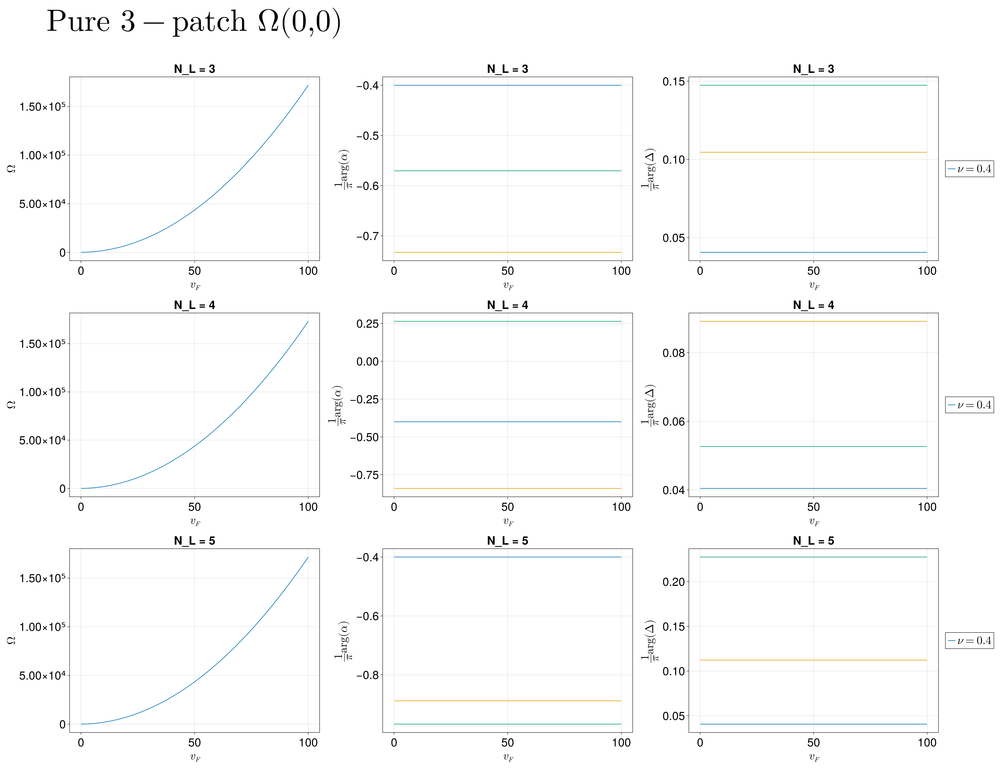

In [42]:
rmg_origin_flips_vF(NL_list, mbz_kappa, w, pd)

<font size="12">$$\Omega(0, 0) \ | \ v_F >> 1$$</font>

In [176]:
function rmg_origin_delta(Nl_list, m_kappa, vF, alpha_list, w, pd)
    ang_pts = 10^2
    ang_list = range(0.05, 0.6, ang_pts)
    curvatures = Array{Float64}(undef, length(alpha_list), ang_pts)
    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))
    P = Figure(size=(2600, 2000), fontsize=30)

    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        ax1 = Axis(P[j, 1], title = "N_L = "*string(Nl), xlabel = L"\frac{1}{\pi} \text{arg}(\Delta)", ylabel = L"\Omega")
        for i in 1:length(alpha_list)
            alpha = alpha_list[i]
            for k in 1:ang_pts
                delta = exp(im * pi * ang_list[k])
                curvatures[i, k] = bc_no_spinors(grid, spacing, vF, delta, alpha)[1]
            end
            lines!(ax1, ang_list, curvatures[i, :], label = "arg(alpha) = "*string(round(angle(alpha)/pi, sigdigits=2)))
        end
        P[j, 2] = Legend(P, ax1, framevisible = true)
    end
    P
end

rmg_origin_delta (generic function with 1 method)

In [181]:
NL_list = [3, 4, 5]
vF = 10
alpha_list = [exp(im * pi/5), exp(im * 3*pi/4), exp(im * 7*pi/3), exp(im * 2*pi/3), 1, 1im]

6-element Vector{ComplexF64}:
  0.8090169943749475 + 0.5877852522924731im
 -0.7071067811865475 + 0.7071067811865476im
  0.5000000000000006 + 0.8660254037844384im
 -0.4999999999999998 + 0.8660254037844387im
                 1.0 + 0.0im
                 0.0 + 1.0im

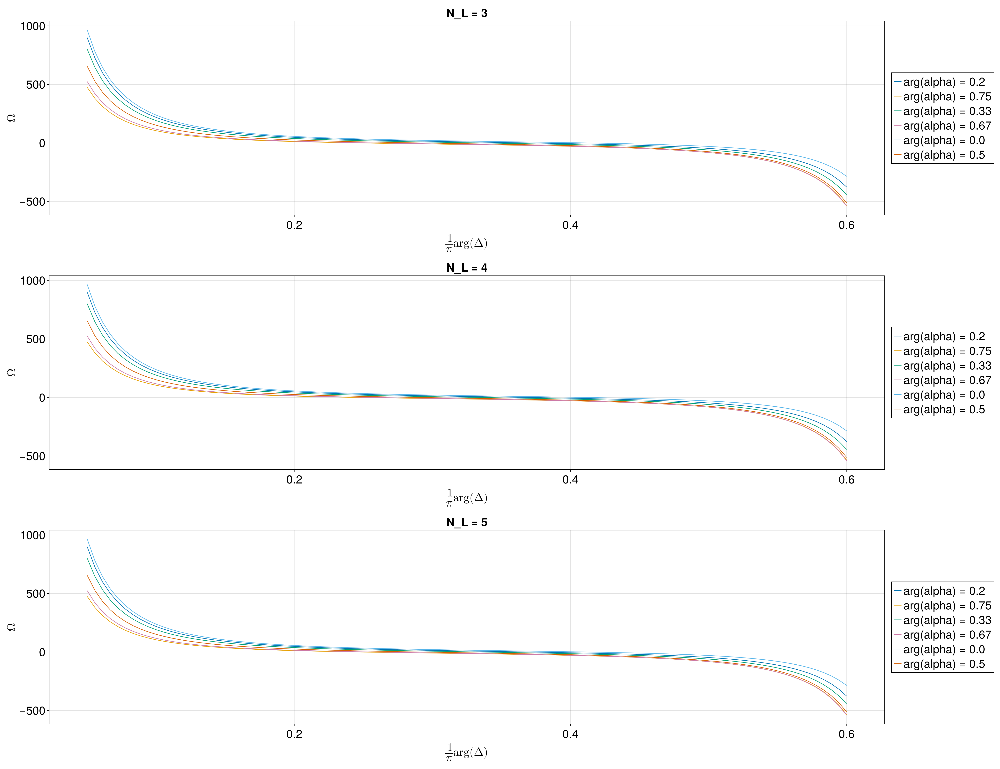

In [182]:
rmg_origin_delta(NL_list, mbz_kappa, vF, alpha_list, w, pd)

<font size="12">$$\Omega_{\text{3P}} (\textbf{k}) \ | \ \nu_{\text{crit}}$$</font>

In [7]:
function rmg_contour_all(Nl_list, nu_list, m_kappa, vF, w, pd)
    # get an mBZ centered at the kappa-point
    grid = make_hex([10^(-16), 10^(-16)], w / 2, w / 2 / pd)
    map = colormap("RdBu", mid = 0)

    spacing = 10^(-2) * (w / 2 / pd)

    fig = Figure(size=(1600, 800 * length(Nl_list)), fontsize=25)

    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        nu = nu_list[j]
        delta = rmg_delta_all(m_kappa, nu, Nl)
        alpha = rmg_alpha_all(m_kappa, nu, Nl)
        orig = reshape([10^(-16), 10^(-16)], (1, 2))

        spinor_bc = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)

        patch_bc = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)
        
        ax1 = Axis(fig[j, 1], title = L"(N_L, \nu) = "*"("*string(Nl)*", "*string(nu)*")", 
        xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], patch_bc, colormap = map)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], patch_bc, colormap = map)
        cb1 = Colorbar(fig[j, 2], tr1)

        ax3 = Axis(fig[j, 3], title = L"(N_L, \nu) = "*"("*string(Nl)*", "*string(nu)*")"
        , xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax3, grid[:, 1], grid[:, 2], spinor_bc, colormap = map)
        X, ax3, tr3 = tricontourf(grid[:, 1], grid[:, 2], spinor_bc, colormap = map)
        cb3 = Colorbar(fig[j, 4], tr3)
    end
    ax_c1 = Axis(fig[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c1, label = false)
    hidespines!(ax_c1)

    ax_c2 = Axis(fig[:, 3], title = L"\text{RMG Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c2, label = false)
    hidespines!(ax_c2)

    fig
end

rmg_contour_all (generic function with 1 method)

In [8]:
NL_list = [5]
vF = 0
nu_list = [0.4]

1-element Vector{Float64}:
 0.4

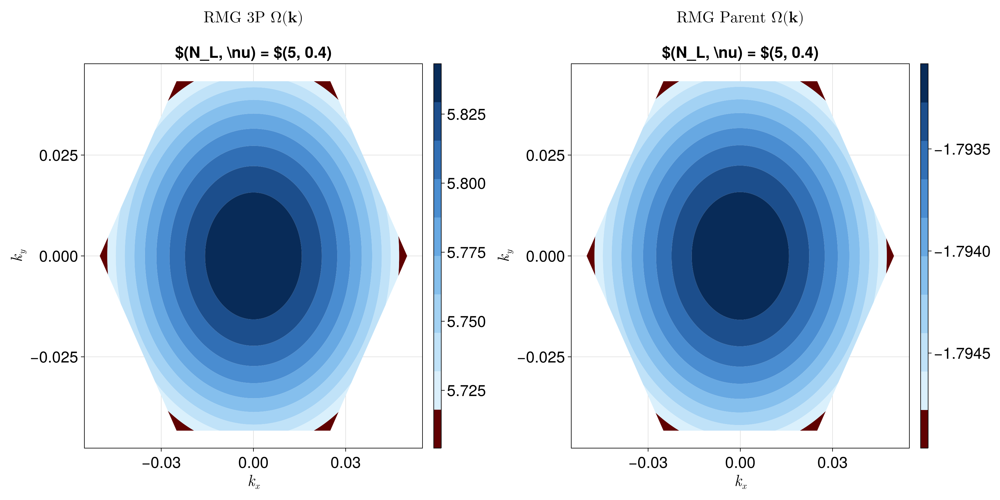

In [9]:
rmg_contour_all(NL_list, nu_list, mbz_kappa, vF, w, pd)

<font size="12">$$\# \ \nu_{\text{crit}}$$</font>

In [201]:
function nu_crit_count(Nl_list, m_kappa, w, pd)
    vF_pts = 10^3
    vF_list = range(1, 100, vF_pts)
    nu_pts = 10^3
    nu_list = range(10^(-7), 1, nu_pts)

    crit_counts = Array{Float64}(undef, length(Nl_list), vF_pts)
    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))

    P = Figure(size=(1500, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    
    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        for i in 1:vF_pts
            vF = vF_list[i]
            pt_count = 0
            curvatures = Array{Float64}(undef, nu_pts)
            for k in 1:nu_pts
                nu = nu_list[k]
                delta = rmg_delta_all(m_kappa, nu, Nl)
                alpha = rmg_alpha_all(m_kappa, nu, Nl)
                curvatures[k] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
            end
            crit_counts[j, i] = size(find_intersections(nu_list, curvatures, nu_list, zeros(nu_pts)), 1)
        end
        ax1 = Axis(P[j, 1], title = "N_L = "*string(Nl), xlabel = L"v_F", ylabel = L"# \ \nu_{\text{crit}}")
        scatter!(ax1, vF_list, crit_counts[j, :])
    end
    axs1 = Axis(P[:, 1], title = L"# \ \nu_{\text{crit}} \ [\Omega_{\text{3P}}(0,0) > 0 \leftrightarrow \Omega_{\text{3P}}(0,0) < 0]", 
    titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)
    P
end

nu_crit_count (generic function with 1 method)

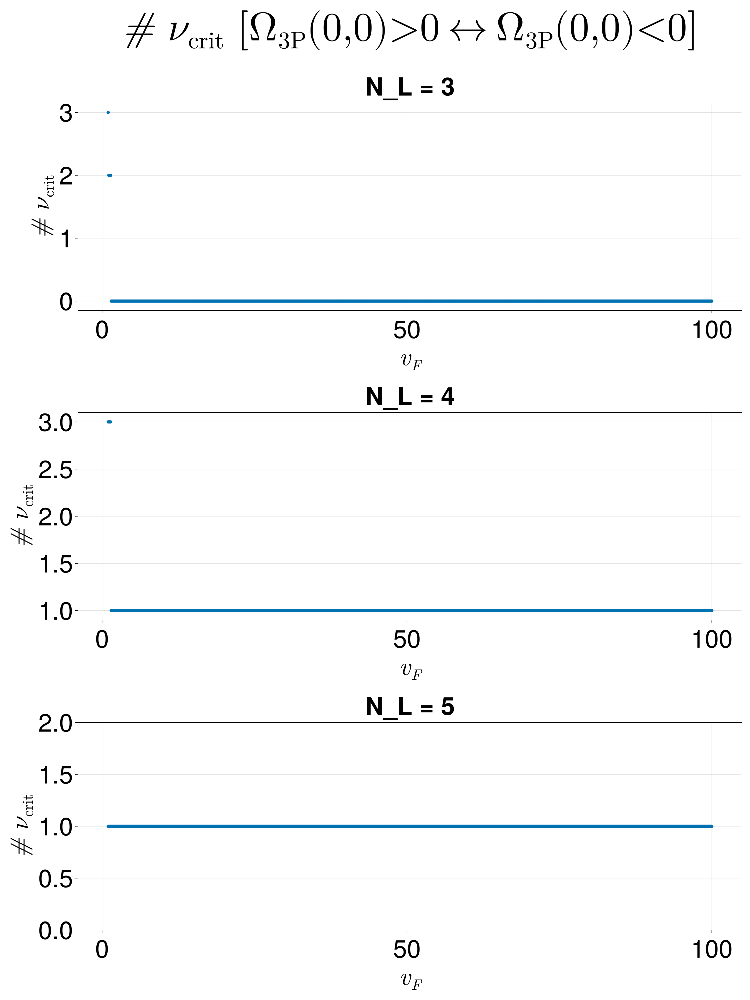

In [202]:
nu_crit_count(NL_list, mbz_kappa, w, pd)

In [203]:
function nu_crit_count_v2(Nl_list, m_kappa, w, pd)
    vF_pts = 10^3
    vF_list = range(0, 100, vF_pts)
    nu_pts = 10^3
    nu_list = range(10^(-7), 0.99, nu_pts)

    crit_counts = Array{Float64}(undef, length(Nl_list), vF_pts)
    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))

    P = Figure(size=(1500, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    
    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        for i in 1:vF_pts
            vF = vF_list[i]
            pt_count = 0
            curvatures = Array{Float64}(undef, nu_pts)
            curvatures_2 = Array{Float64}(undef, nu_pts)
            for k in 1:nu_pts
                nu = nu_list[k]
                delta = rmg_delta_all(m_kappa, nu, Nl)
                alpha = rmg_alpha_all(m_kappa, nu, Nl)
                curvatures[k] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
                curvatures_2[k] = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)[1]
            end
            crit_counts[j, i] = size(find_intersections(nu_list, curvatures, nu_list, curvatures_2), 1)
        end
        ax1 = Axis(P[j, 1], title = "N_L = "*string(Nl), xlabel = L"v_F", ylabel = L"# \ \nu_{\text{crit}}")
        scatter!(ax1, vF_list, crit_counts[j, :])
    end
    axs1 = Axis(P[:, 1], title = L"# \ \nu_{\text{crit}} \ [\Omega_{\text{3P}}(0,0) = \Omega_{\text{RMG}}(0,0)]", 
    titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)
    P
end

nu_crit_count_v2 (generic function with 1 method)

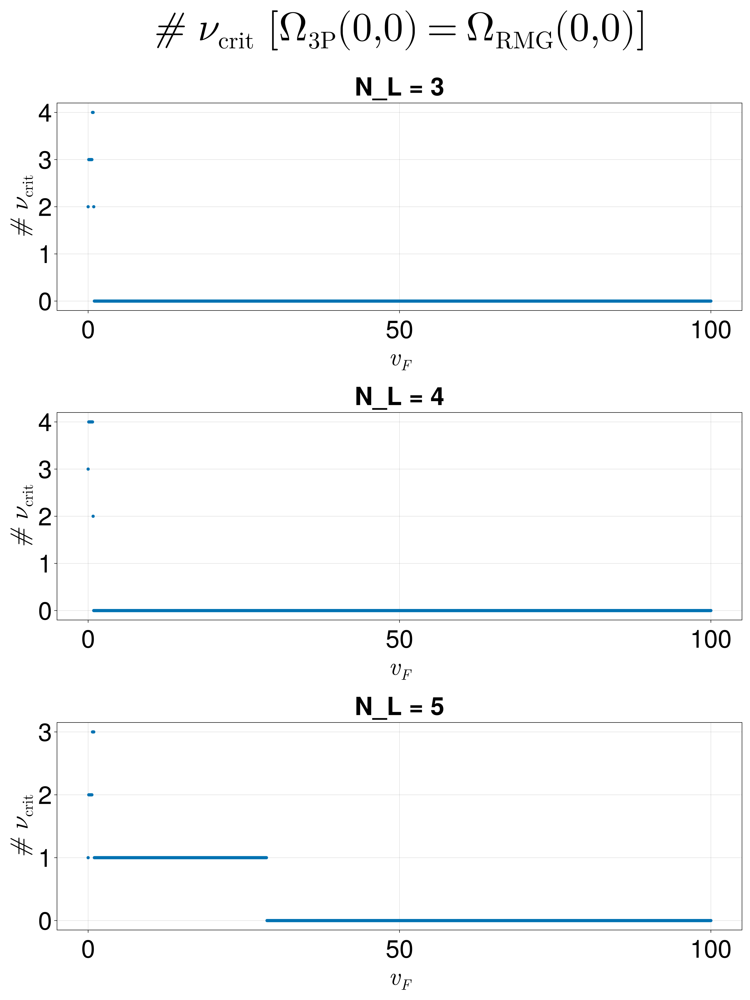

In [204]:
nu_crit_count_v2(NL_list, mbz_kappa, w, pd)

<font size="12">$$\nu_{\text{crit}} (v_F)$$</font>

In [205]:
function nu_crits(Nl_list, m_kappa, w, pd)
    vF_pts = 10^3
    vF_list = range(1, 100, vF_pts)
    nu_pts = 10^3
    nu_list = range(10^(-7), 1, nu_pts)

    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))

    P = Figure(size=(1500, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    
    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        crit_points = []
        vF_points = []
        for i in 1:vF_pts
            vF = vF_list[i]
            curvatures = Array{Float64}(undef, nu_pts)
            for k in 1:nu_pts
                nu = nu_list[k]
                delta = rmg_delta_all(m_kappa, nu, Nl)
                alpha = rmg_alpha_all(m_kappa, nu, Nl)
                curvatures[k] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
            end
            intersections = find_intersections(nu_list, curvatures, nu_list, zeros(nu_pts))
            for m in 1:size(intersections, 1)
                push!(vF_points, vF)
                push!(crit_points, intersections[m, 1])
            end
        end
        ax1 = Axis(P[j, 1], title = "N_L = "*string(Nl), xlabel = L"v_F", ylabel = L"\nu_{\text{crit}}")
        scatter!(ax1, vF_points, crit_points)
    end
    axs1 = Axis(P[:, 1], title = L"\nu_{\text{crit}} \ [\Omega_{\text{3P}}(0,0) > 0 \leftrightarrow \Omega_{\text{3P}}(0,0) < 0]", 
    titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)
    P
end

nu_crits (generic function with 1 method)

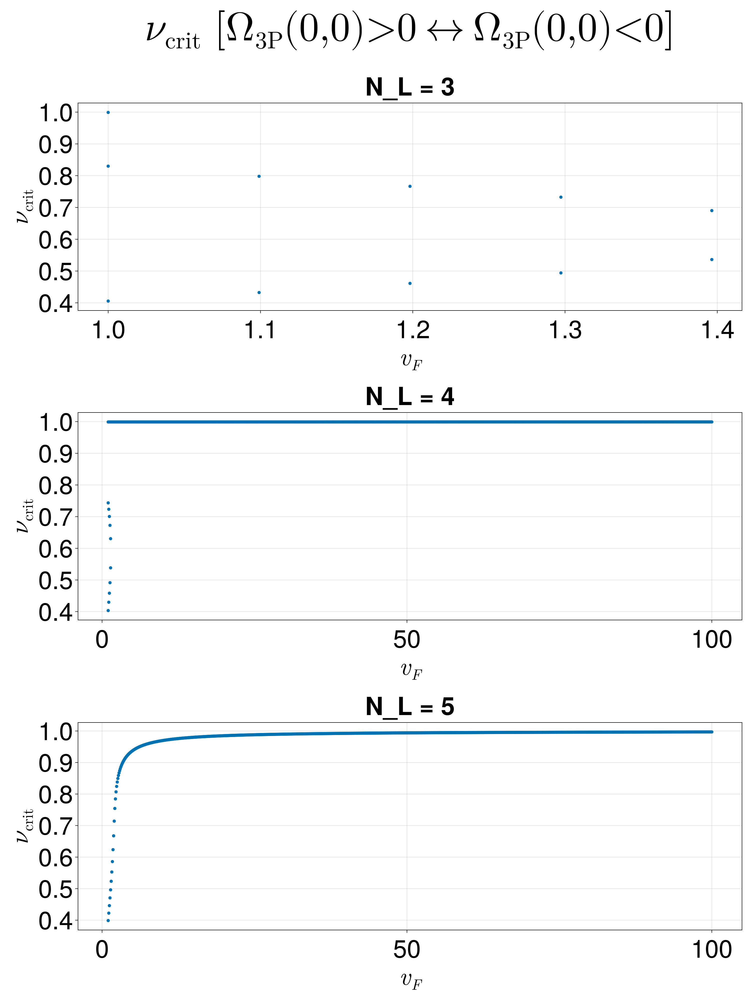

In [206]:
nu_crits(NL_list, mbz_kappa, w, pd)

In [20]:
function nu_crits_v2(Nl_list, m_kappa, w, pd)
    vF_pts = 10^3
    vF_list = range(0, 1, vF_pts)
    nu_pts = 10^3
    nu_list = range(10^(-7), 0.99, nu_pts)

    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))

    P = Figure(size=(1500, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    
    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        crit_points = []
        vF_points = []
        for i in 1:vF_pts
            vF = vF_list[i]
            curvatures = Array{Float64}(undef, nu_pts)
            curvatures_2 = Array{Float64}(undef, nu_pts)
            for k in 1:nu_pts
                nu = nu_list[k]
                delta = rmg_delta_all(m_kappa, nu, Nl)
                alpha = rmg_alpha_all(m_kappa, nu, Nl)
                curvatures[k] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
                curvatures_2[k] = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)[1]
            end
            intersections = find_intersections(nu_list, curvatures, nu_list, curvatures_2)
            for m in 1:size(intersections, 1)
                push!(vF_points, vF)
                push!(crit_points, intersections[m, 1])
            end
        end
        ax1 = Axis(P[j, 1], title = "N_L = "*string(Nl), xlabel = L"v_F", ylabel = L"\nu_{\text{crit}}")
        scatter!(ax1, vF_points, crit_points)
    end
    axs1 = Axis(P[:, 1], title = L"\nu_{\text{crit}} \ [\Omega_{\text{3P}}(0,0) = \Omega_{\text{RMG}}(0,0)]", 
    titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)
    P
end

nu_crits_v2 (generic function with 1 method)

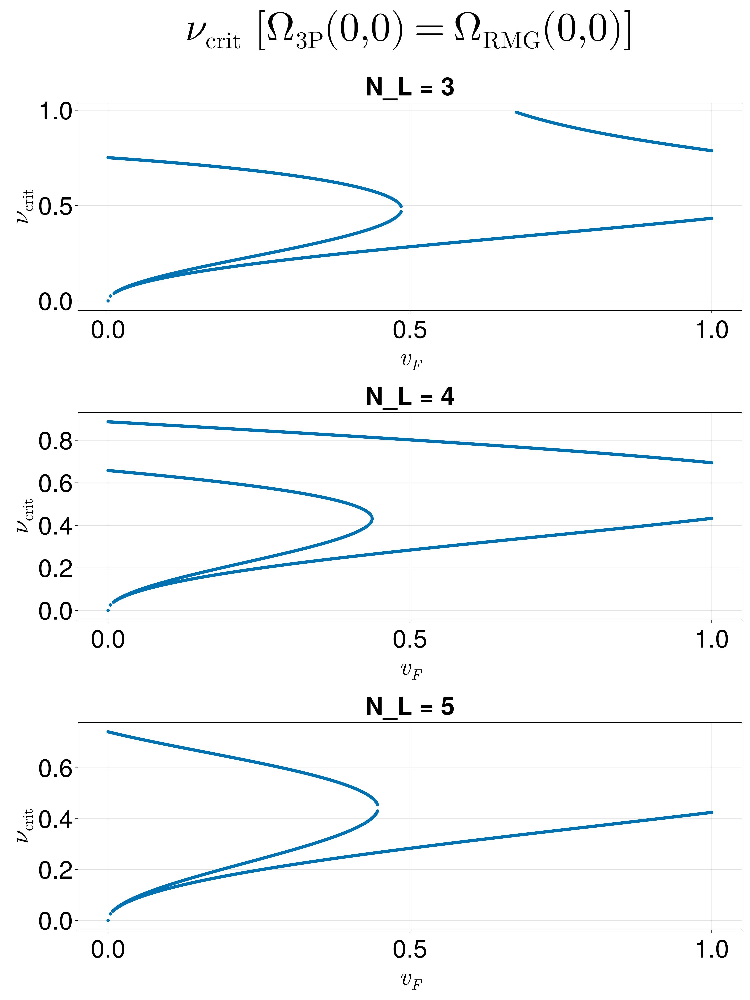

In [21]:
nu_crits_v2(NL_list, mbz_kappa, w, pd)

<font size="12">$$1 \text{-layer potential}$$</font>

In [255]:
function rmg_origin_flips_1l(NL, m_kappa, vF, w, pd, nu_llm, nu_ulm)
    nu_pts = 10^2
    nu_list = range(nu_llm, nu_ulm, nu_pts)
    curvature_1 = Array{Float64}(undef, nu_pts)
    curvature_2 = Array{Float64}(undef, nu_pts)
    spacing = 10^(-2) * (w / 2 / pd)

    Nl_list = collect(1:NL)

    P = Figure(size=(1800, 2000), fontsize=30)

    for j in 1:length(Nl_list)
        l = Nl_list[j]
        for i in 1:nu_pts
            nu = nu_list[i]
            delta = -rmg_delta_layers(m_kappa, nu, NL, [l])
            alpha = -rmg_alpha_layers(m_kappa, nu, NL, [l])
            grid = reshape([10^(-16), 10^(-16)], (1, 2))
            curvature_1[i] = rmg_patch_bc(grid, spacing, NL, nu, m_kappa, vF, delta, alpha)[1]
            curvature_2[i] = rmg_equal_weighted_sum_bc(grid, spacing, NL, nu, m_kappa)[1]
        end
        println(find_intersections(nu_list, curvature_1, nu_list, curvature_2))
        ax1 = Axis(P[j, 1], title = "l = "*string(l), xlabel = L"\nu", ylabel = L"\Omega")
        lines!(ax1, nu_list, curvature_1, label = "3-Patch")
        lines!(ax1, nu_list, curvature_2, label = "Parent")
        P[j, 2] = Legend(P, ax1, framevisible = true)
    end
    axs1 = Axis(P[:, 1], title = L"\text{RMG } \Omega (0, 0), \ N_L=3", titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    P
end

rmg_origin_flips_1l (generic function with 1 method)

In [366]:
NL = 5
vF = 1

1

[0.8945216968700286 -7.50653567232127]
[0.9478059463545312 -7.881401994200811]
Matrix{Float64}(undef, 0, 2)
Matrix{Float64}(undef, 0, 2)
[0.0059225067763187785 -0.00017407536506652832; 0.03474206613522149 -0.004854544065892696]


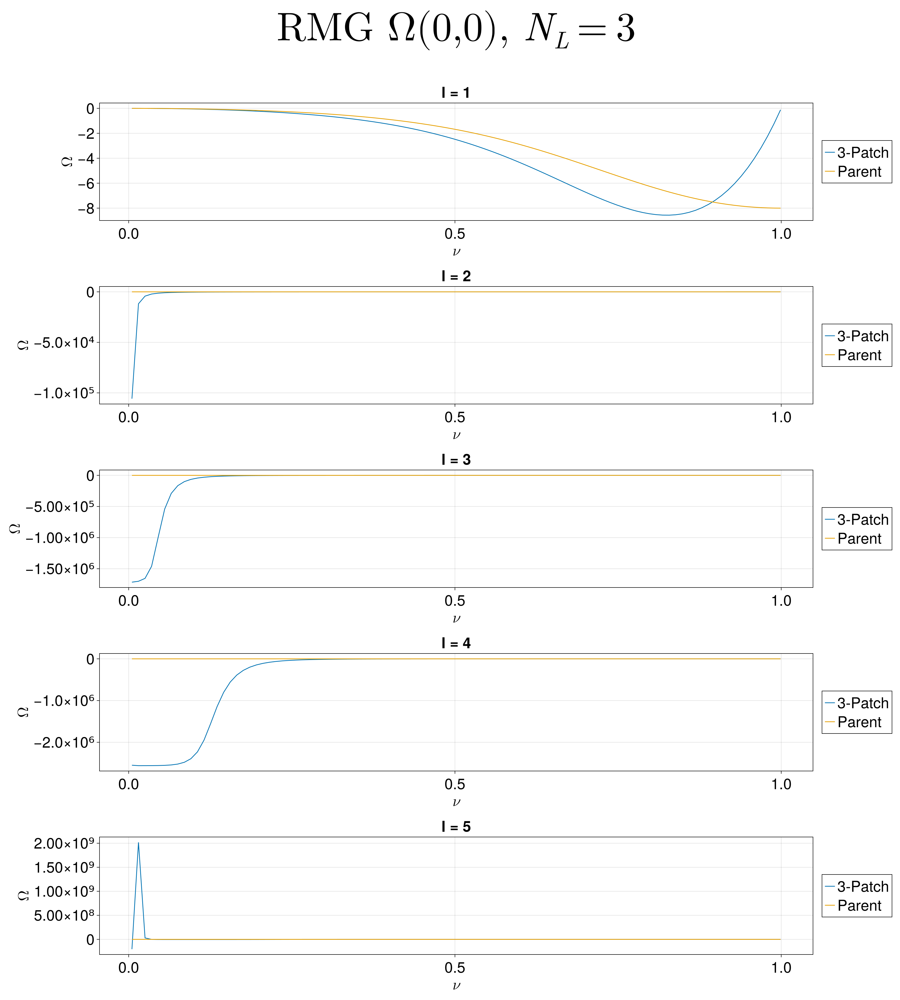

In [367]:
rmg_origin_flips_1l(NL, mbz_kappa, vF, w, pd, 0.005, 0.999)

<font size="12">$$\# \ \nu_{\text{crit}}$$</font>

In [156]:
function nu_crit_count_1l(NL, m_kappa, w, pd)
    vF_pts = 10^3
    vF_list = range(0, 1, vF_pts)
    nu_pts = 10^3
    nu_list = range(0.005, 0.99, nu_pts)
    Nl_list = collect(1:NL)

    crit_counts = Array{Float64}(undef, length(Nl_list), vF_pts)
    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))

    P = Figure(size=(1500, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    
    for j in 1:length(Nl_list)
        l = Nl_list[j]
        for i in 1:vF_pts
            vF = vF_list[i]
            pt_count = 0
            curvatures = Array{Float64}(undef, nu_pts)
            for k in 1:nu_pts
                nu = nu_list[k]
                delta = -rmg_delta_layers(m_kappa, nu, NL, [l])
                alpha = -rmg_alpha_layers(m_kappa, nu, NL, [l])
                curvatures[k] = rmg_patch_bc(grid, spacing, NL, nu, m_kappa, vF, delta, alpha)[1]
            end
            crit_counts[j, i] = size(find_intersections(nu_list, curvatures, nu_list, zeros(nu_pts)), 1)
        end
        ax1 = Axis(P[j, 1], title = "l = "*string(l), xlabel = L"v_F", ylabel = L"# \ \nu_{\text{crit}}")
        scatter!(ax1, vF_list, crit_counts[j, :])
    end
    axs1 = Axis(P[:, 1], title = L"# \ \nu_{\text{crit}} \ [\Omega_{\text{3P}}(0,0) > 0 \leftrightarrow \Omega_{\text{3P}}(0,0) < 0]", 
    titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)
    P
end

nu_crit_count_1l (generic function with 1 method)

In [159]:
NL = 5

5

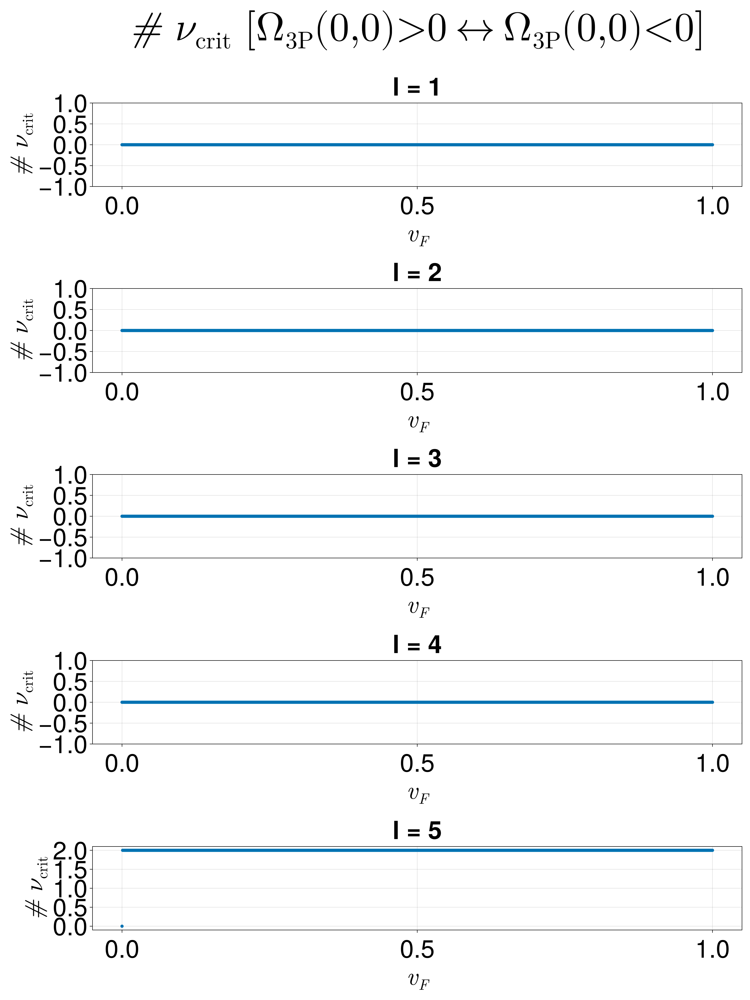

In [160]:
nu_crit_count_1l(NL, mbz_kappa, w, pd)

In [174]:
function nu_crit_count_v2_1l(NL, m_kappa, w, pd)
    vF_pts = 10^3
    vF_list = range(0, 1, vF_pts)
    nu_pts = 10^3
    nu_list = range(0.005, 0.99, nu_pts)
    Nl_list = collect(1:NL)

    crit_counts = Array{Float64}(undef, length(Nl_list), vF_pts)
    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))

    P = Figure(size=(1500, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    
    for j in 1:length(Nl_list)
        l = Nl_list[j]
        for i in 1:vF_pts
            vF = vF_list[i]
            pt_count = 0
            curvatures = Array{Float64}(undef, nu_pts)
            curvatures_2 = Array{Float64}(undef, nu_pts)
            for k in 1:nu_pts
                nu = nu_list[k]
                delta = -rmg_delta_layers(m_kappa, nu, NL, [l])
                alpha = -rmg_alpha_layers(m_kappa, nu, NL, [l])
                curvatures[k] = rmg_patch_bc(grid, spacing, NL, nu, m_kappa, vF, delta, alpha)[1]
                curvatures_2[k] = rmg_equal_weighted_sum_bc(grid, spacing, NL, nu, m_kappa)[1]
            end
            crit_counts[j, i] = size(find_intersections(nu_list, curvatures, nu_list, curvatures_2), 1)
        end
        ax1 = Axis(P[j, 1], title = "l = "*string(l), xlabel = L"v_F", ylabel = L"# \ \nu_{\text{crit}}")
        scatter!(ax1, vF_list, crit_counts[j, :])
    end
    axs1 = Axis(P[:, 1], title = L"# \ \nu_{\text{crit}} \ [\Omega_{\text{3P}}(0,0) = \Omega_{\text{RMG}}(0,0)]", 
    titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)
    P
end

nu_crit_count_v2_1l (generic function with 1 method)

In [182]:
NL = 5

5

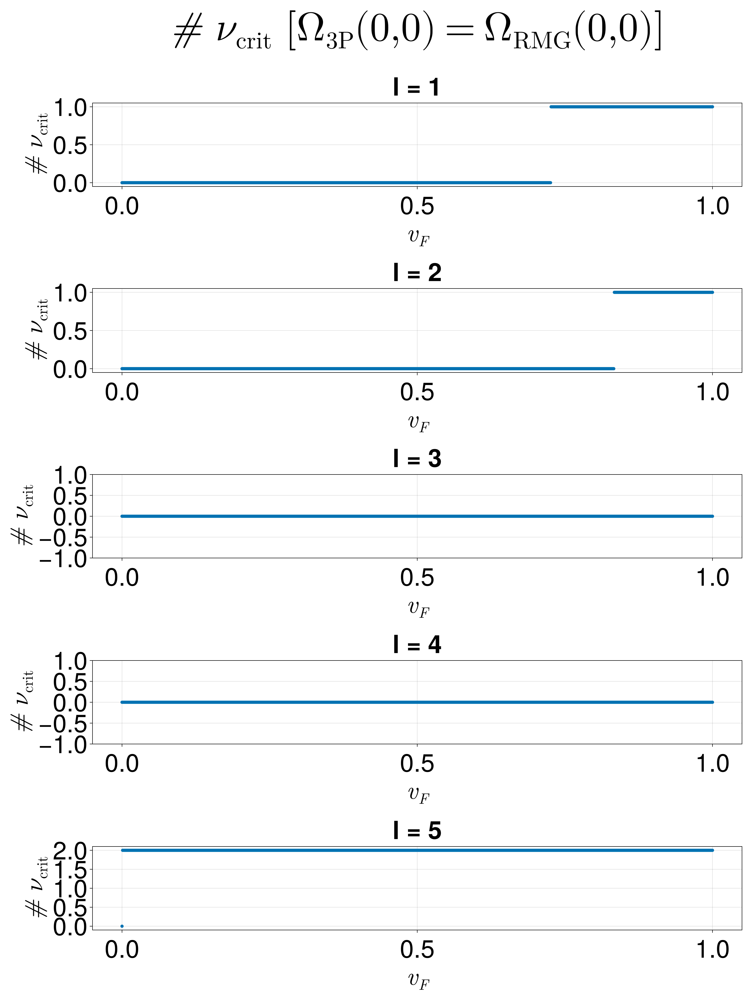

In [183]:
nu_crit_count_v2_1l(NL, mbz_kappa, w, pd)

<font size="12">$$\nu_{\text{crit}} (v_F)$$</font>

In [198]:
function nu_crits_1l(NL, m_kappa, w, pd)
    vF_pts = 10^3
    vF_list = range(0, 1, vF_pts)
    nu_pts = 10^3
    nu_list = range(10^(-7), 0.99, nu_pts)
    Nl_list = collect(1:NL)

    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))

    P = Figure(size=(1500, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    
    for j in 1:NL
        l = Nl_list[j]
        crit_points = []
        vF_points = []
        for i in 1:vF_pts
            vF = vF_list[i]
            curvatures = Array{Float64}(undef, nu_pts)
            for k in 1:nu_pts
                nu = nu_list[k]
                delta = -rmg_delta_layers(m_kappa, nu, NL, [l])
                alpha = -rmg_alpha_layers(m_kappa, nu, NL, [l])
                curvatures[k] = rmg_patch_bc(grid, spacing, NL, nu, m_kappa, vF, delta, alpha)[1]
            end
            intersections = find_intersections(nu_list, curvatures, nu_list, zeros(nu_pts))
            for m in 1:size(intersections, 1)
                push!(vF_points, vF)
                push!(crit_points, intersections[m, 1])
            end
        end
        ax1 = Axis(P[j, 1], title = "l = "*string(l), xlabel = L"v_F", ylabel = L"\nu_{\text{crit}}")
        if length(crit_points) > 0
            scatter!(ax1, vF_points, crit_points)
        end
    end
    axs1 = Axis(P[:, 1], title = L"\nu_{\text{crit}} \ [\Omega_{\text{3P}}(0,0) > 0 \leftrightarrow \Omega_{\text{3P}}(0,0) < 0]", 
    titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)
    P
end

nu_crits_1l (generic function with 1 method)

In [203]:
NL = 5

5

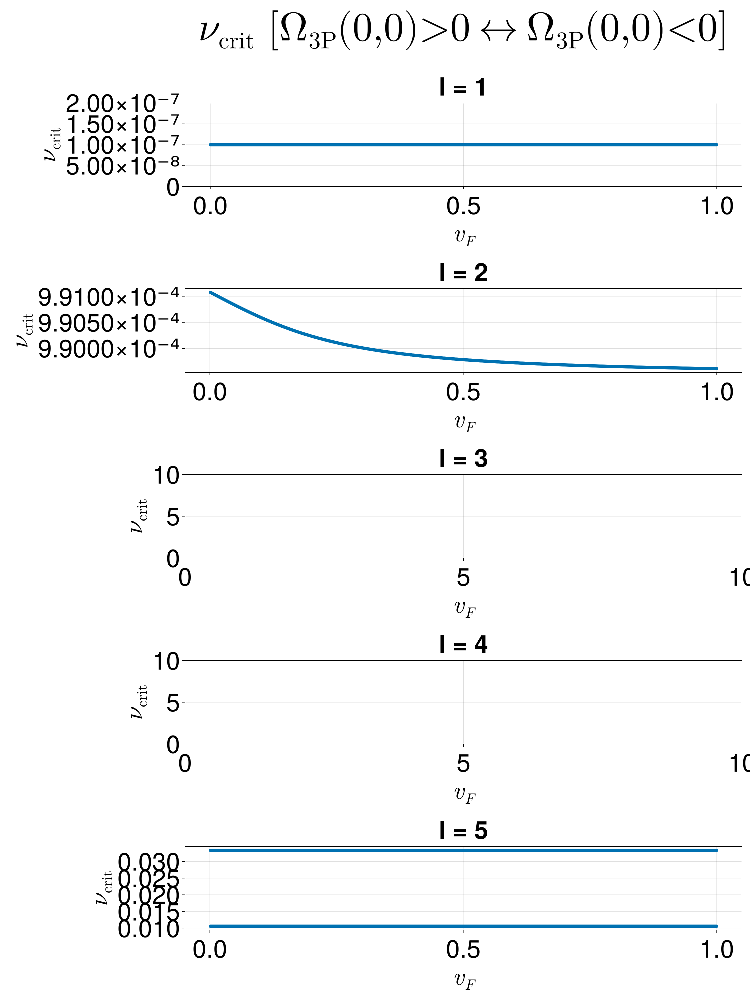

In [204]:
nu_crits_1l(NL, mbz_kappa, w, pd)

In [248]:
function nu_crits_v2_1l(NL, m_kappa, w, pd)
    vF_pts = 10^3
    vF_list = range(0, 1, vF_pts)
    nu_pts = 10^3
    nu_list = range(10^(-7), 0.99, nu_pts)
    Nl_list = collect(1:NL)

    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))

    P = Figure(size=(1500, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    
    for j in 1:NL
        l = Nl_list[j]
        crit_points = []
        vF_points = []
        for i in 1:vF_pts
            vF = vF_list[i]
            curvatures = Array{Float64}(undef, nu_pts)
            curvatures_2 = Array{Float64}(undef, nu_pts)
            for k in 1:nu_pts
                nu = nu_list[k]
                delta = -rmg_delta_layers(m_kappa, nu, NL, [l])
                alpha = -rmg_alpha_layers(m_kappa, nu, NL, [l])
                curvatures[k] = rmg_patch_bc(grid, spacing, NL, nu, m_kappa, vF, delta, alpha)[1]
                curvatures_2[k] = rmg_equal_weighted_sum_bc(grid, spacing, NL, nu, m_kappa)[1]
            end
            intersections = find_intersections(nu_list, curvatures, nu_list, curvatures_2)
            for m in 1:size(intersections, 1)
                push!(vF_points, vF)
                push!(crit_points, intersections[m, 1])
            end
        end
        ax1 = Axis(P[j, 1], title = "l = "*string(l), xlabel = L"v_F", ylabel = L"\nu_{\text{crit}}")
        if length(crit_points) > 0
            scatter!(ax1, vF_points, crit_points)
        end
    end
    axs1 = Axis(P[:, 1], title = L"\nu_{\text{crit}} \ [\Omega_{\text{3P}}(0,0) = \Omega_{\text{RMG}}(0,0)]", 
    titlegap = 100, titlesize = 80)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)
    P
end

nu_crits_v2_1l (generic function with 1 method)

In [253]:
NL = 3

3

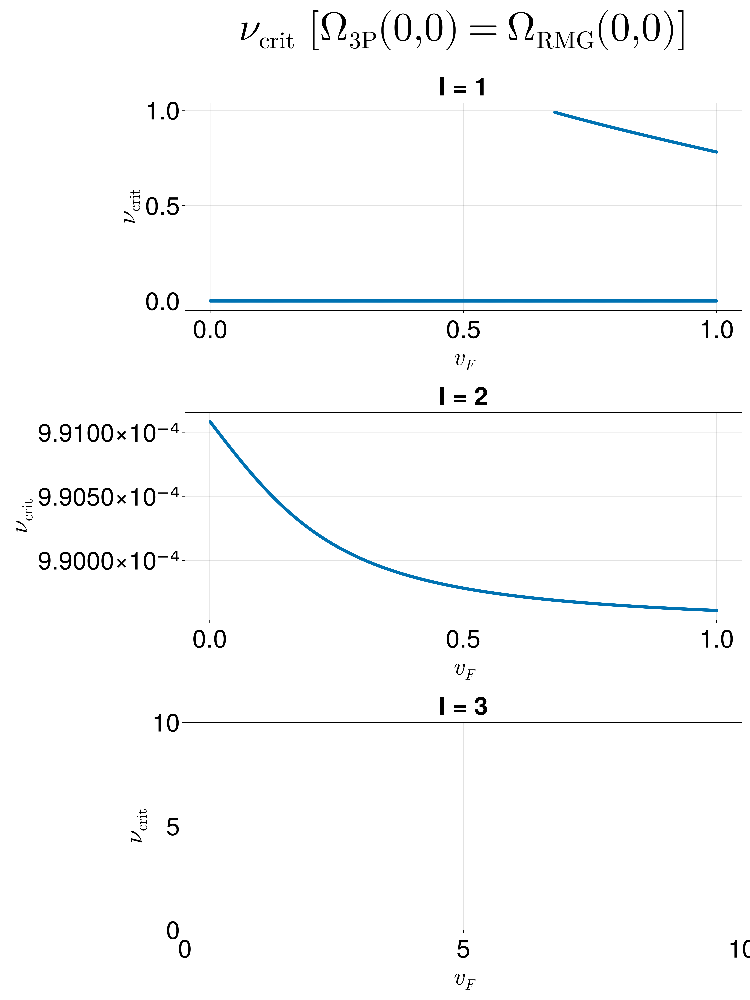

In [254]:
nu_crits_v2_1l(NL, mbz_kappa, w, pd)

<font size="12">$$\Omega_{\text{3P}} (\textbf{k}) \ | \ \nu_{\text{crit}}$$</font>

In [1]:
function rmg_contour_all_1l(NL, l_list, nu_list, m_kappa, vF, w, pd)
    # get an mBZ centered at the kappa-point
    grid = make_hex([10^(-16), 10^(-16)], w / 2, w / 2 / pd)

    spacing = 10^(-2) * (w / 2 / pd)

    fig = Figure(size=(1600, 800 * length(l_list)), fontsize=25)
    map = colormap("RdBu", mid = 0)

    for j in 1:length(l_list)
        l = l_list[j]
        nu = nu_list[j]
        delta = -rmg_delta_layers(m_kappa, nu, NL, [l])
        alpha = -rmg_alpha_layers(m_kappa, nu, NL, [l])
        orig = reshape([10^(-16), 10^(-16)], (1, 2))

        spinor_bc = rmg_equal_weighted_sum_bc(grid, spacing, NL, nu, m_kappa)

        patch_bc = rmg_patch_bc(grid, spacing, NL, nu, m_kappa, vF, delta, alpha)
        
        ax1 = Axis(fig[j, 1], title = L"(l, \nu) = "*"("*string(l)*", "*string(nu)*")", 
        xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], patch_bc, colormap = :RdBu)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], patch_bc, colormap = :RdBu)
        cb1 = Colorbar(fig[j, 2], tr1)

        ax3 = Axis(fig[j, 3], title = L"(l, \nu) = "*"("*string(l)*", "*string(nu)*")"
        , xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax3, grid[:, 1], grid[:, 2], spinor_bc, colormap = :RdBu)
        X, ax3, tr3 = tricontourf(grid[:, 1], grid[:, 2], spinor_bc, colormap = :RdBu)
        cb3 = Colorbar(fig[j, 4], tr3)
    end
    ax_c1 = Axis(fig[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c1, label = false)
    hidespines!(ax_c1)

    ax_c2 = Axis(fig[:, 3], title = L"\text{RMG Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c2, label = false)
    hidespines!(ax_c2)

    fig
end

LoadError: LoadError: UndefVarError: `@L_str` not defined
in expression starting at /Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/notebooks/RMG_exps/rmg_bc_plots.ipynb:21

In [2]:
NL = 5
l_list = [1]
vF = 1
nu_list = [0.8945216968700286]

1-element Vector{Float64}:
 0.8945216968700286

In [3]:
rmg_contour_all_1l(NL, l_list, nu_list, mbz_kappa, vF, w, pd)

UndefVarError: UndefVarError: `rmg_contour_all_1l` not defined

<font size="12">$$\Omega_\text{3p} (0, 0) \ \text{ vs } (\Delta, \alpha)$$</font>

In [340]:
# pure 3-patch Berry curvature at the origin
function pure_3p_origin_delta(alpha_list, alpha_labels, vF, w, pd)
    spacing = 10^(-2) * (w / 2 / pd)
    origin = reshape([10^(-16), 10^(-16)], (1, 2))
    min_delta = 0.8
    max_delta = 1.0
    l_angle = 0.1
    u_angle = pi/2
    map = colormap("RdBu", mid = 0)
    # grid = make_sector(min_delta, max_delta, 10^(-2) * (max_delta - min_delta), l_angle, u_angle)
    re_delta = range(0.5, 1, 10^2)
    im_delta = range(0.5, 1, 10^2)
    grid = mesh_grid(re_delta, im_delta, Float64)
    fig = Figure(size=(1200, 800 * length(alpha_list)), fontsize=25)
    for i in 1:length(alpha_list)
        curvatures = Array{Float64}(undef, size(grid, 1))
        for j in 1:size(grid, 1)
            delta = grid[j, 1] + im * grid[j, 2]
            curvatures[j] = bc_no_spinors(origin, spacing, vF, delta, alpha_list[i])[1]
            # curvatures[j] = bc_no_spinors_analytic(origin, spacing, delta, alpha_list[i], 1)[1]
        end
        ax1 = Axis(fig[i, 1], title = alpha_labels[i], 
        xlabel = L"\text{Re}(\Delta)", ylabel = L"\text{Im}(\Delta)")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], curvatures, colormap = :RdBu)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], curvatures, colormap = :RdBu)
        cb1 = Colorbar(fig[i, 2], tr1)
    end
    fig
end

pure_3p_origin_delta (generic function with 1 method)

In [341]:
alpha_list = [-1, -omega, -conj(omega)]
alpha_labels = [L"\Delta \text{ vs } \tilde{\Omega}(0, 0) \ | \ \text{arg}(\alpha) = \pi, \ v_F = 0", 
L"\Delta \text{ vs } \tilde{\Omega}(0, 0) \ | \ \text{arg}(\alpha) = \frac{5\pi}{3}, \ v_F = 0", 
L"\Delta \text{ vs } \tilde{\Omega}(0, 0) \ | \ \text{arg}(\alpha) = \frac{\pi}{3}, \ v_F = 0"]
vF = 0

0

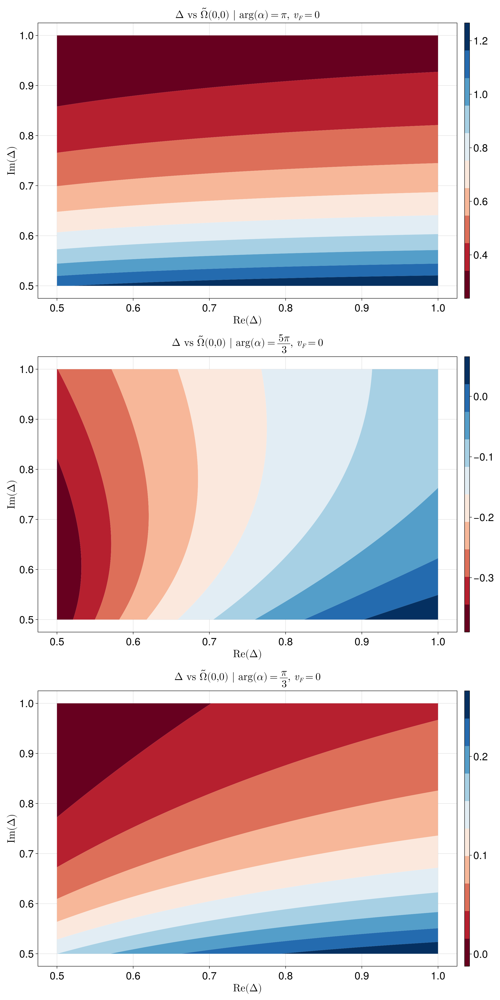

In [342]:
pure_3p_origin_delta(alpha_list, alpha_labels, vF, w, pd)

In [387]:
# pure 3-patch Berry curvature at the origin
function pure_3p_origin_alpha(delta_list, delta_labels, vF, w, pd)
    spacing = 10^(-2) * (w / 2 / pd)
    origin = reshape([10^(-16), 10^(-16)], (1, 2))
    re_alpha = range(-2, 2, 10^2)
    im_alpha = range(-2, 2, 10^2)
    grid = mesh_grid(re_alpha, im_alpha, Float64)
    fig = Figure(size=(1200, 800 * length(delta_list)), fontsize=25)
    for i in 1:length(delta_list)
        curvatures = Array{Float64}(undef, size(grid, 1))
        for j in 1:size(grid, 1)
            alpha = grid[j, 1] + im * grid[j, 2]
            # curvatures[j] = bc_no_spinors(origin, spacing, vF, delta_list[i], alpha)[1]
            curvatures[j] = bc_no_spinors_analytic(origin, spacing, delta_list[i], alpha, 1)[1]
        end
        map = colormap("RdBu", mid = 0)
        ax1 = Axis(fig[i, 1], title = delta_labels[i], 
        xlabel = L"\text{Re}(\alpha)", ylabel = L"\text{Im}(\alpha)")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], curvatures, colormap = :RdBu)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], curvatures, colormap = :RdBu)
        cb1 = Colorbar(fig[i, 2], tr1)
    end
    fig
end

pure_3p_origin_alpha (generic function with 1 method)

In [391]:
delta_list = exp.(im * pi * [2/5, 1/2, 3/5])
delta_labels = [L"\alpha \text{ vs } \tilde{\Omega}(0, 0) \ | \ \text{arg}(\Delta) = \pi, \ v_F = 0", 
L"\alpha \text{ vs } \tilde{\Omega}(0, 0) \ | \ \text{arg}(\Delta) = \frac{5\pi}{3}, \ v_F = 0", 
L"\alpha \text{ vs } \tilde{\Omega}(0, 0) \ | \ \text{arg}(\Delta) = \frac{\pi}{3}, \ v_F = 0"]
vF = 0

0

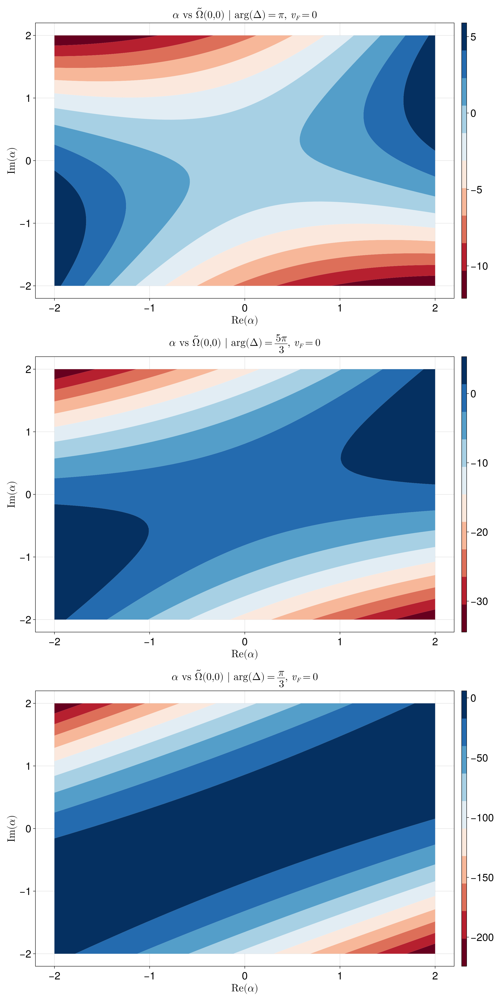

In [392]:
pure_3p_origin_alpha(delta_list, delta_labels, vF, w, pd)